In [246]:
import os
import sys
import gc
import time
import cv2

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm import tqdm

In [307]:
PATH = os.path.join('..', 'input')

In [308]:
train = pd.read_csv(os.path.join(PATH, 'train.csv'))

In [309]:
train.head()

,ImageId_ClassId,EncodedPixels
0,0002cc93b.jpg_1,29102 12 29346 24 29602 24 29858 24 30114 24 3...
1,0002cc93b.jpg_2,NaN
2,0002cc93b.jpg_3,NaN
3,0002cc93b.jpg_4,NaN
4,00031f466.jpg_1,NaN


In [310]:
train['ImageId_ClassId'] = train['ImageId_ClassId'].apply(lambda x: x.split('_'))
train['ImageId'] = train['ImageId_ClassId'].apply(lambda x: x[0])
train['ClassId'] = train['ImageId_ClassId'].apply(lambda x: x[1])

In [311]:
# train = train[train['EncodedPixels'].notnull()].reset_index(drop=True)

In [312]:
train.head()

,ImageId_ClassId,EncodedPixels,ImageId,ClassId
0,"[0002cc93b.jpg, 1]",29102 12 29346 24 29602 24 29858 24 30114 24 3...,0002cc93b.jpg,1
1,"[0002cc93b.jpg, 2]",NaN,0002cc93b.jpg,2
2,"[0002cc93b.jpg, 3]",NaN,0002cc93b.jpg,3
3,"[0002cc93b.jpg, 4]",NaN,0002cc93b.jpg,4
4,"[00031f466.jpg, 1]",NaN,00031f466.jpg,1


In [253]:
os.listdir(os.path.join('..', 'input', 'train_images'))[0]

'58ee62fd7.jpg'

In [254]:
image = cv2.imread(os.path.join('..', 'input', 'train_images', '58ee62fd7.jpg'))
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [255]:
image.shape

(256, 1600, 3)

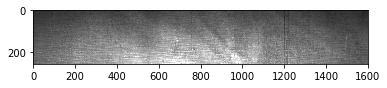

In [256]:
plt.imshow(image)

In [305]:
def rle2mask(rle):
    width, height = 256, 1600
    
    mask = np.zeros(width * height).astype(np.uint8)
    
    array = np.asarray([int(x) for x in rle.split()])
    starts = array[0::2]
    lengths = array[1::2]
    
    for start, length in zip(starts, lengths):
        mask[int(start):int(start+length)] = 255
        
    return np.flipud(np.rot90(mask.reshape(height, width), k=1)) 

# def rle2mask(rle):
#     '''
#     rle: run-length as string formated

#     return: mask image
#     '''
#     img = np.zeros(256*1600, dtype=np.uint8)
    
#     if str(rle) != 'nan':
#         s = rle.split()
#         starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
#         starts -= 1
#         ends = starts + lengths
#         for lo, hi in zip(starts, ends):
#             img[lo:hi] = 255
#     return img.reshape(256, 1600)

def rle2mask(mask_rle, shape):
    "Return an image array from run-length encoded string `mask_rle` with `shape`."
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint)
    for low, up in zip(starts, ends): img[low:up] = 1
    return img.reshape(shape)

In [313]:
fn = train['ImageId'].iloc[0]
img = cv2.imread(f'../input/train_images/{fn}')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
mask = rle2mask(train['EncodedPixels'].iloc[0], (256, 1600))
cv2.imwrite('sample.png', mask)

True

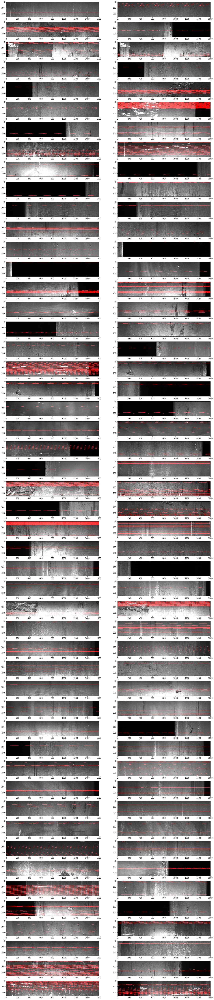

In [315]:
train_ = train[train['EncodedPixels'].notnull()]

fig=plt.figure(figsize=(20,100))
columns = 2
rows = 50
for i in range(1, 100+1):
    fig.add_subplot(rows, columns, i)
    
    fn = train_['ImageId'].iloc[i]
    img = cv2.imread(f'../input/train_images/{fn}')
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    mask = rle2mask(train_['EncodedPixels'].iloc[i], (256, 1600))
    img[mask==1, 0] = 255
    
    plt.imshow(img)
plt.show()

In [264]:
def rle2mask(rle, img):
    width, height, _ = img.shape
    
    mask = np.zeros(width * height).astype(np.uint8)
    
    array = np.asarray([int(x) for x in rle.split()])
    starts = array[0::2]
    lengths = array[1::2]
    
    for start, length in zip(starts, lengths):
        mask[int(start):int(start+length)] = 255
        
    return np.flipud(np.rot90(mask.reshape(height, width), k=1))

In [119]:
fn = train['ImageId'].iloc[0]
img = cv2.imread(f'../input/train_images/{fn}')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
mask = rle2mask(train['EncodedPixels'].iloc[0], img)
cv2.imwrite('sample_notnull.png', mask)

True

In [120]:
mask.shape, img.shape

((256, 1600), (256, 1600, 3))

In [107]:
train_ = train[train['EncodedPixels'].notnull()]
for i, row in tqdm(train_.iterrows()):
    fn = row['ImageId']
    img = cv2.imread(os.path.join('..', 'input', 'train_images', f'{fn}'))
    mask = rle2mask(row['EncodedPixels'], img)
    cv2.imwrite(os.path.join('..', 'input', 'train_masks', f'f{fn}'), mask)

7095it [01:15, 94.59it/s]


In [121]:
def rle2mask(rle, img):
    width, height, _ = img.shape
    
    mask = np.zeros(width * height).astype(np.uint8)
        
    return np.flipud(np.rot90(mask.reshape(height, width), k=1))

In [122]:
fn = train['ImageId'].iloc[1]
img = cv2.imread(f'../input/train_images/{fn}')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
mask = rle2mask(train['EncodedPixels'].iloc[1], img)
cv2.imwrite('sample_null.png', mask)

True

In [123]:
mask.shape, img.shape

((256, 1600), (256, 1600, 3))

In [124]:
train_ = train[train['EncodedPixels'].isnull()]
for i, row in tqdm(train_.iterrows()):
    fn = row['ImageId']
    img = cv2.imread(os.path.join('..', 'input', 'train_images', f'{fn}'))
    mask = rle2mask(row['EncodedPixels'], img)
    cv2.imwrite(os.path.join('..', 'input', 'train_masks', f'f{fn}'), mask)

43177it [06:20, 113.57it/s]


In [140]:
str(train_['EncodedPixels'][1]) == 'nan'

True

In [150]:
train['is_null'] = train['EncodedPixels'].apply(lambda x: str(x) == 'nan')

In [155]:
train.head()

,ImageId,ClassId,EncodedPixels,is_null
0,0002cc93b.jpg,1,29102 12 29346 24 29602 24 29858 24 30114 24 3...,False
1,0002cc93b.jpg,2,NaN,True
2,0002cc93b.jpg,3,NaN,True
3,0002cc93b.jpg,4,NaN,True
4,00031f466.jpg,1,NaN,True


In [156]:
train.to_csv(os.path.join('..', 'input', 'train.csv'), index=False)

In [149]:
train.drop(['ImageId_ClassId'], axis=1, inplace=True)

In [154]:
train = train.loc[:, ['ImageId', 'ClassId', 'EncodedPixels', 'is_null']]

In [158]:
img.shape

(256, 1600, 3)

In [160]:
train.sort_values(by=['ImageId', 'ClassId'], ascending=True, inplace=True)
gdf = train.groupby('ImageId')

train_image_ids = list()
train_rles = list()

for image_id, tdf in gdf:
    rles = tdf['EncodedPixels'].values
    train_image_ids.append(image_id)
    train_rles.append(rles)

train_id2rles = dict(zip(train_image_ids, train_rles))

In [175]:
test_df = pd.read_csv('../input/sample_submission.csv')

In [176]:
test_df.head()

,ImageId_ClassId,EncodedPixels
0,004f40c73.jpg_1,1 1
1,004f40c73.jpg_2,1 1
2,004f40c73.jpg_3,1 1
3,004f40c73.jpg_4,1 1
4,006f39c41.jpg_1,1 1


In [177]:
test_df['ImageId'], test_df['ClassId'] = zip(*test_df['ImageId_ClassId'].apply(lambda x: x.split('_')))

In [178]:
test_df.head()

,ImageId_ClassId,EncodedPixels,ImageId,ClassId
0,004f40c73.jpg_1,1 1,004f40c73.jpg,1
1,004f40c73.jpg_2,1 1,004f40c73.jpg,2
2,004f40c73.jpg_3,1 1,004f40c73.jpg,3
3,004f40c73.jpg_4,1 1,004f40c73.jpg,4
4,006f39c41.jpg_1,1 1,006f39c41.jpg,1


In [179]:
test_df.to_csv('../input/test.csv', index=False)

In [207]:
train.head()

,ImageId,1,2,3,4
0,0002cc93b.jpg,29102 12 29346 24 29602 24 29858 24 30114 24 3...,NaN,NaN,NaN
1,00031f466.jpg,NaN,NaN,NaN,NaN
2,000418bfc.jpg,NaN,NaN,NaN,NaN
3,000789191.jpg,NaN,NaN,NaN,NaN
4,0007a71bf.jpg,NaN,NaN,18661 28 18863 82 19091 110 19347 110 19603 11...,NaN


In [205]:
train = pd.read_csv(os.path.join('..', 'input', 'train.csv'))
train = pd.pivot_table(train, index='ImageId', columns='ClassId', values='EncodedPixels', aggfunc=lambda x: x, dropna=False)
train = train.reset_index()
train.columns = [str(i) for i in train.columns.values]

# mask_list = []
# for (_, row) in train.iterrows():
#     print(row)
#     mask = np.zeros((256, 1600, 4))
#     for i in range(0, 4):
#         mask[:,:, i] = rle2mask(row[f'{i+1}'], (256, 1600))
#     mask_list.append(mask)

# with open(os.path.join('..', 'input', 'mask.pkl'), 'wb') as f:
#     pickle.dump(mask_list, f)

In [206]:
train.shape

(12568, 5)

In [202]:
pd.read_csv(os.path.join('..', 'input', 'train.csv'))['ImageId'].unique()

array(['0002cc93b.jpg', '00031f466.jpg', '000418bfc.jpg', ...,
       'fffe98443.jpg', 'ffff4eaa8.jpg', 'ffffd67df.jpg'], dtype=object)

In [212]:
train.iloc[0]['ImageId']

'0002cc93b.jpg'

In [216]:
t = train.iloc[0]

In [220]:
type(t)

pandas.core.series.Series

In [221]:
t

ImageId                                        0002cc93b.jpg
1          29102 12 29346 24 29602 24 29858 24 30114 24 3...
2                                                        NaN
3                                                        NaN
4                                                        NaN
Name: 0, dtype: object

In [224]:
type(t['2'])

float

In [225]:
train = pd.read_csv(os.path.join('..', 'input', 'train.csv'))
train = pd.pivot_table(train, index='ImageId', columns='ClassId', values='EncodedPixels', aggfunc=lambda x: x, dropna=False)
train = train.reset_index()
train.columns = [str(i) for i in train.columns.values]

In [235]:
train.head()

,ImageId,1,2,3,4,class_count,split_label
0,0002cc93b.jpg,29102 12 29346 24 29602 24 29858 24 30114 24 3...,NaN,NaN,NaN,1,1
1,00031f466.jpg,NaN,NaN,NaN,NaN,0,0
2,000418bfc.jpg,NaN,NaN,NaN,NaN,0,0
3,000789191.jpg,NaN,NaN,NaN,NaN,0,0
4,0007a71bf.jpg,NaN,NaN,18661 28 18863 82 19091 110 19347 110 19603 11...,NaN,1,3


In [228]:
train['class_count'] = train[['1', '2', '3', '4']].count(axis=1)

In [234]:
def make_split_label(x):
    if x['class_count'] != 1:
        return 0
    if str(x['1']) != 'nan':
        return 1
    if str(x['2']) != 'nan':
        return 2
    if str(x['3']) != 'nan':
        return 3
    if str(x['4']) != 'nan':
        return 4

train['split_label'] = train[['1', '2', '3', '4', 'class_count']].apply(lambda x: make_split_label(x), axis=1)

In [236]:
train.to_csv('../input/train.csv', index=False)

In [237]:
train.shape

(12568, 7)

In [238]:
from sklearn.model_selection import train_test_split
train_idx, valid_idx, _, _ = train_test_split(train.index, train['split_label'], test_size=0.2, random_state=43)

In [243]:
train_idx.values

array([6900, 3415, 3308, ..., 7985, 2303, 3392])

In [244]:
train.iloc[train_idx]

,ImageId,1,2,3,4,class_count,split_label
6900,8bfc35309.jpg,NaN,NaN,NaN,NaN,0,0
3415,45041352a.jpg,NaN,NaN,NaN,NaN,0,0
3308,42d65967f.jpg,NaN,NaN,294579 12 294829 20 295074 33 295328 36 295583...,NaN,1,3
4857,62b560fca.jpg,NaN,NaN,NaN,NaN,0,0
3860,4e46ce4ca.jpg,NaN,NaN,20994 26 21250 76 21506 127 21762 178 22018 22...,NaN,1,3
12529,ff1020719.jpg,NaN,NaN,130714 8 130970 22 131226 37 131482 52 131738 ...,NaN,1,3
3775,4cb4d7b60.jpg,NaN,NaN,NaN,NaN,0,0
2765,37c13cf96.jpg,NaN,NaN,NaN,NaN,0,0
5045,669dbcc19.jpg,NaN,NaN,5 252 261 252 517 252 773 252 1028 253 1284 25...,NaN,1,3
1358,1b6aefdb7.jpg,NaN,NaN,163316 10 163554 28 163792 46 164030 64 164268...,NaN,1,3


In [245]:
len(train)

12568

In [279]:
def rle2mask(rle, shape):
    '''
    rle: run-length as string formated
    shape: (width, height)
    is_null: whether rle is null or not

    return: mask image
    '''
    width, height = shape
    
    mask = np.zeros(width * height).astype(np.uint8)
    
    if str(rle) != 'nan':
        array = np.asarray([int(x) for x in rle.split()])
        starts = array[0::2]
        lengths = array[1::2]
        
        for start, length in zip(starts, lengths):
            mask[int(start):int(start+length)] = 1
    return np.flipud(np.rot90(mask.reshape(height, width), k=1))

In [297]:
import pickle

train = pd.read_csv(os.path.join('..', 'input', 'preprocessed_train.csv'))

mask_list = []
for (_, row) in tqdm(train.iterrows()):
    mask = np.zeros((256, 1600, 4))
    for i in range(0, 4):
        mask[:, :, i] = rle2mask(row[f'{i+1}'], (256, 1600))
    with open(os.path.join('sample.pkl'), 'wb') as f:
        pickle.dump(mask, f)
    break

0it [00:00, ?it/s]


In [281]:
train.head()

,ImageId,1,2,3,4,class_count,split_label
0,0002cc93b.jpg,29102 12 29346 24 29602 24 29858 24 30114 24 3...,NaN,NaN,NaN,1,1
1,00031f466.jpg,NaN,NaN,NaN,NaN,0,0
2,000418bfc.jpg,NaN,NaN,NaN,NaN,0,0
3,000789191.jpg,NaN,NaN,NaN,NaN,0,0
4,0007a71bf.jpg,NaN,NaN,18661 28 18863 82 19091 110 19347 110 19603 11...,NaN,1,3


In [282]:
sum(sum(sum(mask)))

4396.0

In [298]:
for (_, row) in tqdm(train.iterrows()):
    with open('sample.pkl', 'rb') as f:
        mask = pickle.load(f)
    break

0it [00:00, ?it/s]


In [299]:
mask.shape

(256, 1600, 4)

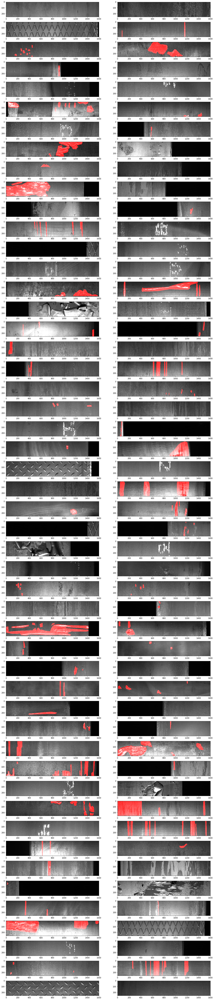

In [302]:
fig=plt.figure(figsize=(20,100))
columns = 2
rows = 50
for i in range(1, 100+1):
    fig.add_subplot(rows, columns, i)
    
    fn = train['ImageId'].iloc[i]
    img = cv2.imread(f'../input/train_images/{fn}')
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    fn = fn.replace('jpg', 'pkl')
    with open(f'../input/train_masks/{fn}', 'rb') as f:
        mask = pickle.load(f)
    img[mask[:, :, 0]==1, 0] = 255
    img[mask[:, :, 1]==1, 0] = 255
    img[mask[:, :, 2]==1, 0] = 255
    img[mask[:, :, 3]==1, 0] = 255
    
    plt.imshow(img)
plt.show()

In [393]:
def rle2mask(rle):
    width, height = 256, 1600
    
    mask = np.zeros(width * height).astype(np.uint8)
    
    array = np.asarray([int(x) for x in rle.split()])
    starts = array[0::2]
    lengths = array[1::2]
    
    for start, length in zip(starts, lengths):
        mask[int(start):int(start+length)] = 1
        
    return np.flipud(np.rot90(mask.reshape(height, width), k=1)) 

def mask2rle(img):
    '''
    img: numpy array, 1 - mask, 0 - background

    return: run-length as string formated
    '''
    pixels = img.T.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)

In [414]:
train = pd.read_csv(os.path.join('..', 'input', 'preprocessed_train.csv'))

mask_list = []
for (_, row) in tqdm(train.iterrows()):
    for i in range(0, 1):
        mask = rle2mask(row[f'{i+1}'])
    break

0it [00:00, ?it/s]


In [394]:
mask_ = rle2mask(mask2rle(mask))

In [395]:
sum(mask_.flatten())

4396

In [396]:
sum(mask.flatten())

4396

In [397]:
sum(sum(mask - mask_))

256

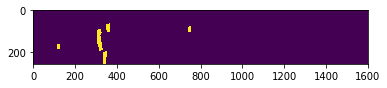

In [398]:
plt.imshow(mask)

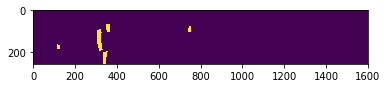

In [399]:
plt.imshow(mask_)

In [460]:
def run_length_encode(mask):
    m = mask.T.flatten()
    if m.sum() == 0:
        rle=''
    else:
        m   = np.concatenate([[0], m, [0]])
        run = np.where(m[1:] != m[:-1])[0] + 1
        run[1::2] -= run[::2]
        rle = ' '.join(str(r) for r in run)
    return rle

def run_length_decode(rle, height=256, width=1600, fill_value=1):
    mask = np.zeros((height,width), np.float32)
    if rle != '':
        mask=mask.reshape(-1)
        r = [int(r) for r in rle.split(' ')]
        r = np.array(r).reshape(-1, 2)
        for start,length in r:
            start = start-1  #???? 0 or 1 index ???
            mask[start:(start + length)] = fill_value
        mask = mask.reshape(width, height).T
    return mask

In [542]:
def run_length_encode(component):
    if component.sum() == 0:
        return ''
    component = np.hstack([np.array([0]), component.T.flatten(), np.array([0])])
    start  = np.where(component[1: ] > component[:-1])[0]
    end    = np.where(component[:-1] > component[1: ])[0]
    length = end-start
      
    rle = []
    for i in range(len(length)):
        if i==0:
            rle.extend([start[0], length[0]])
        else:
            rle.extend([start[i], length[i]])

    rle = ' '.join([str(r) for r in rle])
    return rle

def run_length_decode(rle, height=256, width=1600, fill_value=1):
    component = np.zeros((height, width), np.float32)
    if rle == '':
        return component
    component = component.reshape(-1)
    rle  = np.array([int(s) for s in rle.split(' ')])
    rle  = rle.reshape(-1, 2)
    start = 0
    for index,length in rle:
        start = index
        end   = start+length
        component[start : end] = fill_value
        start = end

    component = component.reshape(width, height).T
    return component

In [552]:
# train['1'][0]

In [553]:
mask = rle2mask(train['1'][0])

In [554]:
mask2 = run_length_decode(train['1'][0])

In [555]:
train['1'][0]

'29102 12 29346 24 29602 24 29858 24 30114 24 30370 24 30626 24 30882 24 31139 23 31395 23 31651 23 31907 23 32163 23 32419 23 32675 23 77918 27 78174 55 78429 60 78685 64 78941 68 79197 72 79452 77 79708 81 79964 85 80220 89 80475 94 80731 98 80987 102 81242 105 81498 105 81754 104 82010 104 82265 105 82521 31 82556 69 82779 27 82818 63 83038 22 83080 57 83297 17 83342 50 83555 13 83604 44 83814 8 83866 37 84073 3 84128 31 84390 25 84652 18 84918 8 85239 10 85476 29 85714 47 85960 57 86216 57 86471 58 86727 58 86983 58 87238 59 87494 59 87750 59 88005 60 88261 60 88517 60 88772 61 89028 53 89283 40 89539 32 89667 10 89795 30 89923 28 90050 29 90179 37 90306 27 90434 38 90562 14 90690 38 90817 9 90946 38 91073 3 91202 38 91458 38 91714 38 91969 39 92225 39 92481 39 92737 39 92993 39 93248 40 93504 40 93760 40 94026 30 94302 10 189792 7 190034 21 190283 28 190539 28 190795 28 191051 28 191307 28 191563 28 191819 28 192075 28 192331 28 192587 28 192843 23 193099 14 193355 5'

In [556]:
mask2_ = run_length_decode(run_length_encode(mask2))

In [557]:
sum(sum(mask2 - mask2_))

0.0

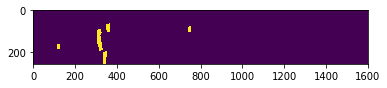

In [558]:
plt.imshow(mask2)

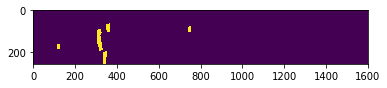

In [559]:
plt.imshow(mask2_)

In [560]:
sum(sum(mask - mask2))

0.0

In [561]:
def mask2rle(img):
    '''
    img: numpy array, 1 - mask, 0 - background

    return: run-length as string formated
    '''
    pixels = img.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)

def run_length_encode(mask):
    m = mask.T.flatten()
    if m.sum() == 0:
        rle=''
    else:
        m   = np.concatenate([[0], m, [0]])
        run = np.where(m[1:] != m[:-1])[0] + 1
        run[1::2] -= run[::2]
        rle = ' '.join(str(r) for r in run)
    return rle

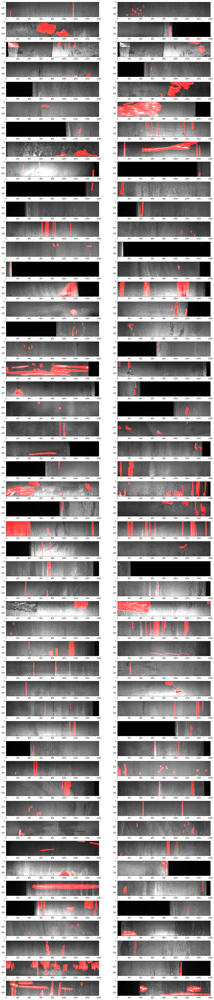

In [562]:
train = pd.read_csv('../input/train.csv')

train['ImageId_ClassId'] = train['ImageId_ClassId'].apply(lambda x: x.split('_'))
train['ImageId'] = train['ImageId_ClassId'].apply(lambda x: x[0])
train['ClassId'] = train['ImageId_ClassId'].apply(lambda x: x[1])

train_ = train[train['EncodedPixels'].notnull()]

fig=plt.figure(figsize=(20,100))
columns = 2
rows = 50
for i in range(1, 100+1):
    fig.add_subplot(rows, columns, i)
    
    fn = train_['ImageId'].iloc[i]
    img = cv2.imread(f'../input/train_images/{fn}')
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    mask = run_length_decode(train_['EncodedPixels'].iloc[i])
    img[mask==1, 0] = 255
    
    plt.imshow(img)
plt.show()